## cats vs dogs classifier   

- 이미지 분류할 때 이미 잘 학습되어 있는 모델을 사용해본다.
- 사전학습 모델인 Backbone 모델의 종류와 개념을 알고, Transfer Learning의 개념을 이해한다.
- VGG, ResNet과 같은 기본적인 Backbone 모델을 불러와서 사용해본다.
- Backbone 모델을 원하는 레이어만큼 새로 학습시켜서 사용해본다.
- Backbone 모델을 Transfer Learning 시킴으로써 원하는 이미지를 분류해본다.

In [1]:
# 실습 중 관련 패키지 버전 등의 이유로 경고 메시지가 출력될 수 있기 때문에 아래 코드를 실행해 방지한다.
import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
print(tf.__version__)

2.7.0


#### 모델 학습을 위한 데이터셋 준비하기
강아지와 고양이 이미지 데이터가 필요한데, 텐서플로우에서 제공하는 데이터셋을 사용한다.

In [3]:
# 패키지 로드
import tensorflow_datasets as tfds

tfds.__version__

'4.0.1'

`tensorflow_datasets`는 텐서플로우가 제공하는 데이터셋 모음집이다.  
강아지와 고양이 이미지뿐만 아니라 음성 데이터셋, 이미지 데이터셋, 텍스트 데이터셋 등 방대한 종류의 데이터셋을 제공한다.

In [4]:
# 데이터셋 로드

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True
)

In [5]:
# 데이터셋 확인
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


모든 데이터셋은 `(image, label)`의 형태를 가진다. `((None, None, 3), ())`가 이를 나타낸다. 여기에서 `(None, None, 3)`은 image의 shape을, 뒤의 `()`은 정답 카테고리인 label의 shape을 의미한다.  

이미지는 `(height, width, channel)` 3차원 데이터이기 때문에 `(None, None, 3)`과 같이 나타난다. 이 때 `height`와 `width`가 `None`으로 나타난 이유는 무엇일까?  

모든 이미지의 크기가 다르기 때문이다. 사이즈가 정해져 있지 않기 때문에 `None`으로 나타낸 것이다.  

뒤의 `3`이라는 숫자는 이미지의 색을 표현하는 채널의 수를 나타낸다. 컬러 이미지의 경우, 색은 RGB이 세 가지 색 조합으로 나타내기 때문에 컬러 이미지는 항상 3개의 채널을 가져야 한다. 반면, 흑백 이미지는 white/black만 나타내면 되기 때문에 단 하나의 채널만 있어도 충분하다.  

label은 특정 이미지가 강아지인지, 혹은 고양이인지를 나타내는 단일 값이다. 단순히 1차원의 숫자 하나로 표현될 수 있기 때문에 차원이 따로 나타나지 않았다.

#### 데이터 시각화 및 모델에 입력할 수 있는 형태로 전처리

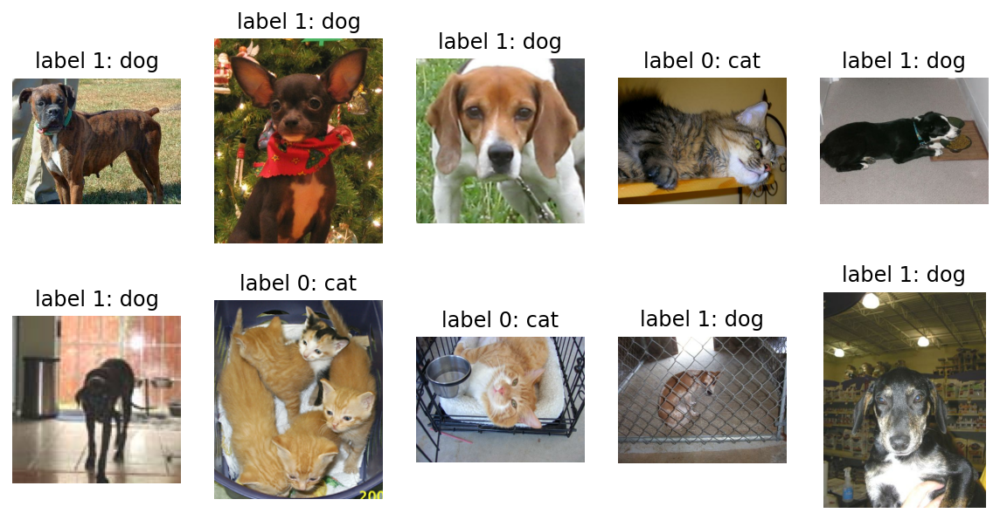

In [6]:
# 데이터 확인을 위해 matplotlib 라이브러리 import
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# raw_train 데이터를 확인해보기 위해 tf.data.Dataset에서 제공하는 take 함수 사용
# 인수로 받은 개수만큼의 데이터를 추출해 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)): # 10개의 데이터 로드
  plt.subplot(2, 5, idx+1)
  plt.imshow(image)
  plt.title(f'label {label}: {get_label_name(label)}')
  plt.axis('off')

이미지의 사이즈가 전부 제각각이다. 모델을 학습시키기 위해 이미지 사이즈를 통일시켜주는 작업이 필요하다.  
`format_example()` 함수를 이용해 이미지를 같은 포맷으로 통일시켜보자.  
아래 코드는 이미지의 사이즈를 160x160 픽셀로 통일시킬뿐만 아니라, 각 픽셀값의 scale을 수정해주는 역할도 한다.  
> 간단 상식 - 타입캐스팅(type casting)  
형변환이라고도 불리는 타입캐스팅은 다른 데이터 타입으로 형을 바꿔주는 것을 의미한다.  
정수형을 실수형으로 바꾸기 위해 `float()`을 사용하는 것이 타입캐스팅의 한 예이다.

In [7]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
  image = tf.cast(image, tf.float32)  # image = float(image) 같은 타입캐스팅의 텐서플로우 버전
  image = (image/127.5) -1 #. 픽셀값의 scale 수정 (0~255 to -1~1의 실수값)
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  return image, label

이제 `format_example()` 함수를 `raw_train`, `raw_validation`, `raw_test`에 `map()` 함수로 적용시켜서 원하는 모양의 train, validation, test 데이터셋으로 변환해보자.  
리스트 원소 전체에 동일한 변환 함수를 for문을 사용하지 않고 손쉽게 적용하게 해주는 `map()` 함수에 대해서는 아래 링크를 참고하자.

- [리스트에 map 함수 적용하기](https://dojang.io/mod/page/view.php?id=2286)

In [8]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


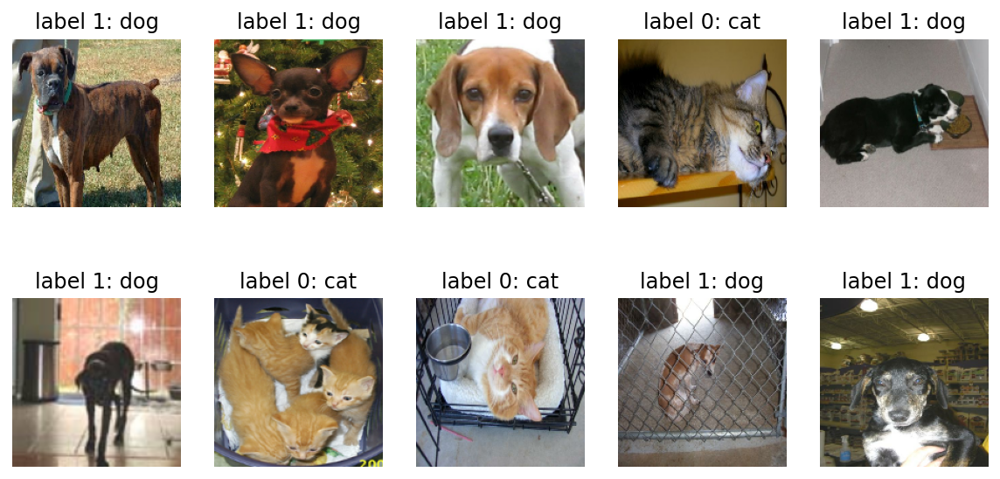

In [9]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)): # 10개의 데이터 로드
  plt.subplot(2, 5, idx+1)
  image = (image + 1) / 2 # matplotlib에서 이미지를 시각화할 경우 모든 픽셀값이 양수이기 때문에 0-1 사이의 값으로 변환
  plt.imshow(image)
  plt.title(f'label {label}: {get_label_name(label)}')
  plt.axis('off')

#### 텐서플로우를 활용해 모델 구조 설계하기

In [10]:
# 모델 생성에 필요한 함수 로드
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

`models`는 모델 그 자체를 구축하기 위한 함수들을 포함하고 있고, `layers`에는 모델의 구성요소인 여러 가지 종류의 레이어라는 함수들을 가지고 있다. `Sequential`은 말 그대로 연속적인 모델을 쌓기 위한 함수이고, `Sequential` 함수 안에 연속적으로 여러 가지 레이어들이 들어간다.  

위에서 가져온 함수들로 바로 모델을 만들어보며 더 구체적으로 살펴보자.

In [11]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

앞으로 딥러닝에서의 레이어라는 개념을 더 자세하게 고민해보고 공부하겠지만, 딥러닝 모델은 언제나 위와 같이 여러 개의 층을 쌓은 형태로 구성된다.  
`Conv2D`, `MaxPooling2D`, `Flatten`, `Dense`라는 네 가지 종류의 레이어를 사용했다.  
모델의 전체 구조를 `summary`로 확인해보자.

In [12]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 20, 20, 64)       0

`summary()` 메서드는 모델의 전체 구조를 한 눈에 보여준다.  
`summary()`에서 출력된 표는 `(160, 160, 3)` 크기의 이미지가 모델에 입력된 후 각 레이어를 지나면서 그 이미지의 사이즈가 어떻게 변화하는지를 나타내주고 있다. 처음 6개의 레이어를 지나고 난 후의 shape은 **(None, height, width, channel)로 4차원**이다.  
첫 번째 차원은 데이터의 개수를 나타낸다. 여기서는 정해지지 않은 수라는 `None` 기호로 표시되었다. `None`은 배치 사이즈에 따라 모델에 다른 수의 입력이 들어올 수 있음을 나타낸다.  
데이터 하나의 크기는 `(height, width, channel)`로 3차원이다. 6개의 레이어를 지나면서 height와 width는 점점 작아지고, channel은 점점 커지다가, flatten 계층을 만나 25600(20x20x64)이라는 하나의 숫자로, 즉 1차원으로 shape가 줄어든다.  

앞의 CNN(Convolutional Neural Net)에서 점점 작은 feature map이 출력되다가, Flatten과 Dense 레이어를 거쳐 1차원으로 shape이 줄어드는 네트워크는 CNN을 사용한 딥러닝 모델의 가장 대표적인 형태다.  

이미지 한 장이 입력되면 그 이미지는 Convolutional(합성곱) 연산을 통해 그 형태가 점점 길쭉해지다가, Flatten 레이어를 만나면 한 줄로 펴져 3차원의 이미지를 1차원으로 펼친다.  

Flatten을 조금 더 직관적으로 이해하기위해 배열을 다루기 용이한 `numpy`를 활용해보자. 

In [13]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [14]:
image.flatten()

array([1, 2, 3, 4])

모델에서 flatten 레이어를 통과한다는 것도 위와 같이 모든 숫자를 일렬로 펼쳐놓는 것과 같다.  

그 후 Dense 레이어에서 512개의 노드로 축소시켜 최종 출력은 단 두 개의 숫자로 구성된 하나의 확률분포를 내뱉게 된다. 이 두 숫자는 각각 입력된 이미지가 강아지일 확률과 고양이일 확률을 의미하게 될 것이다.  

정리해보자면, 딥러닝 모델은 (160, 160, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾸다가 최종적으로는 몇 개의 숫자를 출력해내는 함수라고 할 수 있다.

#### 모델 compile 완료 후 학습시키기
모델이 학습하는 데에 필요한 학습률(`learning_rate`)이라는 파라미터를 0.0001로 설정해주고, 모델을 `compile`하여 학습할 수 있는 형태로 변환해보자.

In [15]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

`compile`을 하기 위해서는 `optimizer`, `loss`, `metrics` 세 가지가 필요하다.
- `optimizer`는 **학습을 어떤 방식으로 시킬 것인지** 결정한다. 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고 부르기도 한다.
- `loss`는 **모델이 학습해나가야 하는 방향**을 결정한다. 이 문제에서는 모델의 출력은 입력받은 이미지가 고양이인지 강아지인지에 대한 확률분포로 두었으므로, 입력 이미지가 고양이(label=0)일 경우 모델의 출력이 `[1.0, 0.0]`에 가깝도록, 강아지(label=1)일 경우 `[0.0, 1.0]`에 가까워지도록 하는 방향을 제시한다.
- `metrics`는 **모델의 성능을 평가하는 척도**다. 분류 문제를 풀 때, 성능을 평가할 수 있는 지표는 정확도(accruracy), 정밀도(precision), 재현율(recall) 등이 있다. 여기서는 정확도를 사용했다. 

> 성능 평가 지표에 대한 자세한 내용은 [링크](https://sumniya.tistory.com/26)를 참고하자.  


이 세 가지를 모두 정해주면서 `compile`을 마무리하면 모델은 학습될 준비가 마무리된 것이다.  
이제 모델을 학습시킬 데이터를 준비한다.  
한 스텝에 학습시킬 데이터의 개수인 `BATCH_SIZE`와 학습 데이터를 적절히 섞어줄 `SHUFFLE_BUFFER_SIZE`를 설정한다.

In [16]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

`BATCH_SIZE`에 따라 32개의 데이터를 랜덤으로 뿌려줄 `train_batches`, `validation_batches`, `test_batches`를 만들어 주자. `train_batches`는 모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공해 줄 것이다.

In [17]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

`train_batches`에서 하나의 batch만 꺼내 데이터를 확인해보자.

In [18]:
for image_batch, label_batch in train_batches.take(1):
  pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

- image_batch의 shape는 (160, 160, 3)의 shape인 32개의 데이터가 존재한다는 뜻이다. 즉, 데이터 하나의 크기는 (160, 160, 3)이고, 그 개수가 32개이다.
- label은 강아지이면 1, 고양이이면 0으로 정답 label을 나타내기 때문에 한 batch에 데이터가 32개라면 label은 0 또는 1의 32개의 숫자로만 구성된다.  

본격적으로 모델을 학습시켜보기 전에, 초기 모델의 성능은 어떤지 확인해보자.  
validation(검증)을 하기 위한 데이터셋인 `validation_batches`를 이용해 20번의 예측을 해보고, 평균 `loss`와 `accuracy`를 확인해보자.

In [19]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print('initial loss: {:.2f}'.format(loss0))
print('initial accuracy: {:2f}'.format(accuracy0))

20/20 [==============================] - 3s 75ms/step - loss: 0.6955 - accuracy: 0.4984
initial loss: 0.70
initial accuracy: 0.498437


여기서 `loss`는 **얼마나 모델이 틀렸는지** 나타낸다. 따라서 `loss`는 낮을수록 좋은 것이다. 또한 `accuracy`는 **몇 퍼센트의 정확도를 보이느냐**에 대한 수치다. 강아지와 고양이를 분류하려고 하는데, 두 장 중 하나를 찍어도 50%는 나올테니 지금 모델은 전혀 의미 없는 예측을 하는 것이라고 할 수 있다.  

그렇다면 10 epoch를 학습시켜서 정확도가 어떻게 변하는지 확인해보자.

In [20]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 69s 114ms/step - loss: 0.5941 - accuracy: 0.6752 - val_loss: 0.5505 - val_accuracy: 0.7145
Epoch 2/10
582/582 [==============================] - 67s 112ms/step - loss: 0.4846 - accuracy: 0.7681 - val_loss: 0.5367 - val_accuracy: 0.7399
Epoch 3/10
582/582 [==============================] - 68s 113ms/step - loss: 0.4231 - accuracy: 0.8079 - val_loss: 0.6287 - val_accuracy: 0.6922
Epoch 4/10
582/582 [==============================] - 68s 113ms/step - loss: 0.3720 - accuracy: 0.8378 - val_loss: 0.4662 - val_accuracy: 0.7833
Epoch 5/10
582/582 [==============================] - 68s 113ms/step - loss: 0.3231 - accuracy: 0.8643 - val_loss: 0.4583 - val_accuracy: 0.7997
Epoch 6/10
582/582 [==============================] - 68s 113ms/step - loss: 0.2754 - accuracy: 0.8868 - val_loss: 0.5008 - val_accuracy: 0.7855
Epoch 7/10
582/582 [==============================] - 68s 113ms/step - loss: 0.2311 - accuracy: 0.9066 - val_loss: 0.5139 - val_ac

- 첫 번째 `accuracy`는 훈련 데이터셋에 대한 정확도다. 학습하고 있는 데이터에 대한 정확도라고 할 수 있다. 
- 두 번째 `val_accuracy`는 검증 데이터셋에 대한 정확도다. 학습하지 않고 있는, 즉 해당 학습 단계에서 보지 않은 데이터에 대한 정확도다.  

훈련 데이터셋에 대한 정확도가 높은 것은 당연하다. 지금 공부하고 있는 문제집에 대한 점수는 당연히 한 번도 보지 않은 시험지를 푸는 것보다 높을 것이기 때문이다.  

10 epochs를 모두 학습한 후에는 훈련 데이터셋에 대한 정확도는 약 90%, 검증 데이터셋에 대한 정확도는 80%에 미치지 못한다.  
각 단계에 다른 정확도 변화를 그래프로 확인해보자.

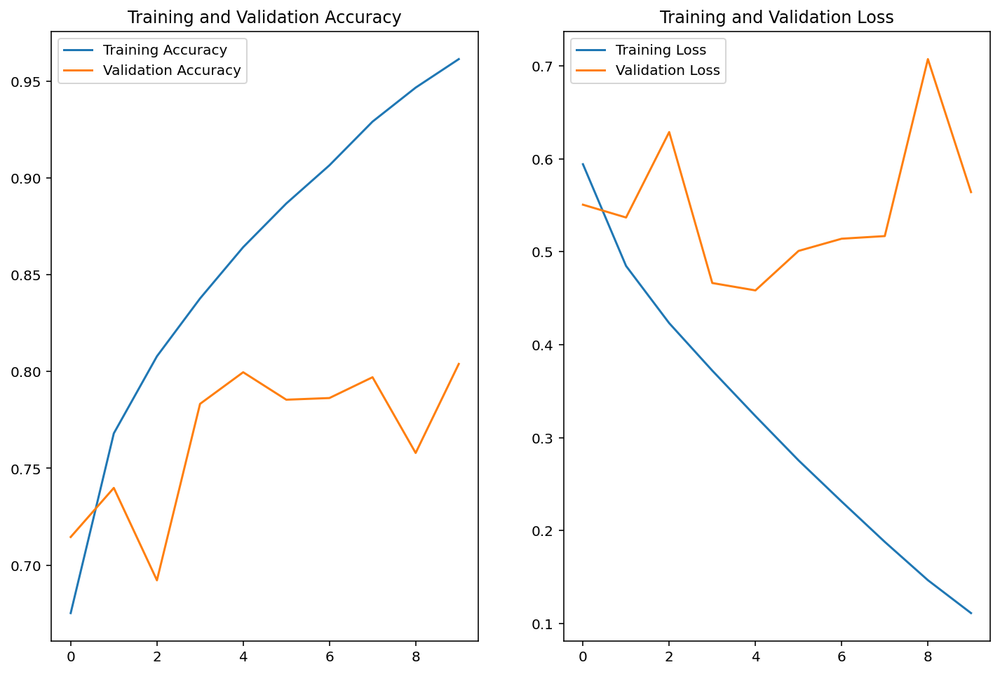

In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12,8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()  # 범례 표시
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

- training accuracy는 10 epoch를 진행하는 동안 꾸준히 증가한다. 마지막에는 거의 90%를 넘어서는 수치를 보인다.
- 반면, validation accuracy는 초반에 75%~80% 사이까지는 증가하지만 증가폭이 training dataset에 비해 매우 적고, 증가하는 양상도 불안정하다.
- training accuracy는 현재 학습하는 데이터셋에 대한 정확도이기 때문에 모델의 구조나 데이터셋 등에 문제가 없다면 일반적으로 학습하면 할수록 꾸준히 계속 오른다. 반면 validation accuracy는 학습하지 않은 데이터셋에 대한 정확도이기 때문에 일정수준까지 오른 후에는 계속 오를지 장담할 수 없다.   
<br>
<br>

이러한 문제를 칭하는 용어는 **과적합(Overfitting)**이다. 모델의 성능이 제대로 올라가려면 학습하지 않은 데이터에 대해서도 성능이 좋아야 하는데, 훈련 데이터만으로 계속 학습하다 보니 그 데이터에만 과도하게 적합되어서 일반화 능력이 떨어지게 되는 것이다.  

딥러닝 모델을 학습시킬 때는 과적합 문제를 예민하게 다루고, 과적합이 되지 않는 순간을 잘 잡아내 일반화가 잘 되는 모델로 학습시키는 것이 중요하다.  

마지막으로 검증 정확도(validation accuracy)가 80%에 못 미치게 올라간 모델의 예측 결과를 확인해보자. `model.predict`를 활용한다.

In [22]:
for image_batch, label_batch in test_batches.take(1):
  images = image_batch
  labels = label_batch
  predictions = model.predict(image_batch)
  pass

predictions

array([[9.98296678e-01, 1.70338806e-03],
       [7.49588490e-01, 2.50411481e-01],
       [2.87136585e-01, 7.12863386e-01],
       [9.99943972e-01, 5.60084845e-05],
       [7.48880327e-01, 2.51119643e-01],
       [6.31935373e-02, 9.36806440e-01],
       [7.67304737e-05, 9.99923229e-01],
       [1.69199839e-01, 8.30800235e-01],
       [2.75705963e-01, 7.24294066e-01],
       [2.10116729e-01, 7.89883316e-01],
       [1.53577998e-01, 8.46422076e-01],
       [9.99976397e-01, 2.36348569e-05],
       [9.92226362e-01, 7.77369319e-03],
       [5.76820632e-04, 9.99423146e-01],
       [9.98595178e-01, 1.40480499e-03],
       [9.99828458e-01, 1.71482083e-04],
       [2.42618278e-01, 7.57381737e-01],
       [6.53948984e-04, 9.99346077e-01],
       [9.34825003e-01, 6.51749894e-02],
       [9.99946594e-01, 5.34592546e-05],
       [9.69129980e-01, 3.08699887e-02],
       [6.22605741e-01, 3.77394259e-01],
       [9.99519467e-01, 4.80480841e-04],
       [8.93112302e-01, 1.06887765e-01],
       [3.844391

prediction 값들을 실제 추론한 label로 변환해보자. 

In [23]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 1, 0, 0, 0, 1])

이제 32장의 image들과 32개의 label, 32개의 prediction을 얻었으니 각각을 시각화해 확인해보자.

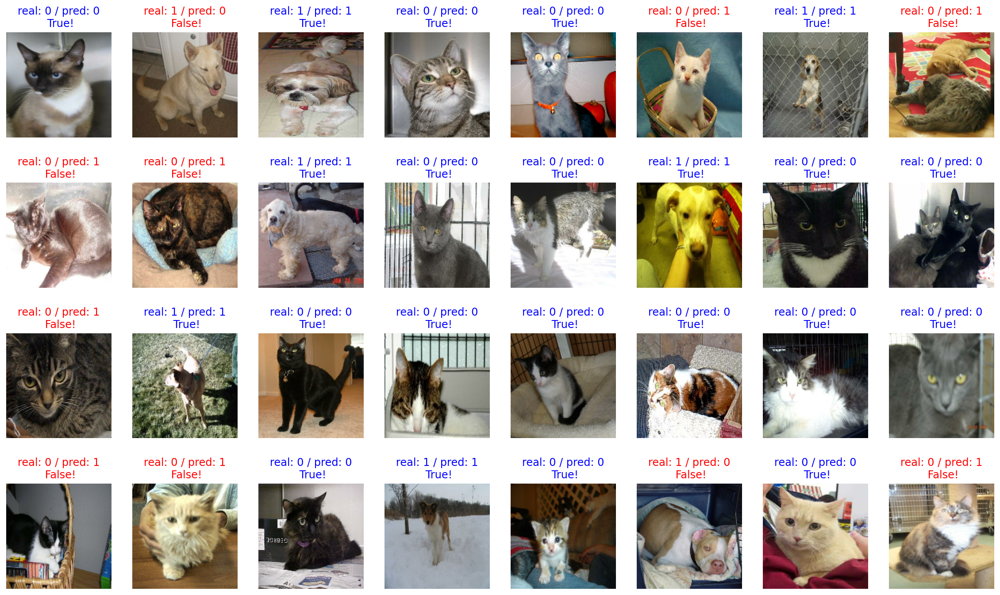

In [24]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
  plt.subplot(4, 8, idx+1)
  image = (image + 1) / 2
  plt.imshow(image)
  correct = label == prediction
  title = f'real: {label} / pred: {prediction}\n {correct}!'
  if not correct:
    plt.title(title, fontdict={'color': 'red'})
  else:
    plt.title(title, fontdict={'color': 'blue'})
  plt.axis('off')

대부분 맞았지만, 틀린 것도 종종 보인다. 틀린 이미지들을 유심히 보면 다른 명확한 이미지들보다는 조금 어려웠을 수도 있어 보인다.  
위의 32개 이미에 대해서는 에측(prediction)의 정확도(accuracy)가 몇일까?

In [25]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)   

68.75


여기까지 직접 모델을 설계해서 만들어보고, 학습시켜 보았다. 이제, 내가 만든 모델 말고 누군가가 이미 만들어 놓은 모델을 활용해보자. 

<br>

#### 이미지 분류 대회인 ILSVRC와 데이터셋 ImageNet
딥러닝 세계에서 이미지 분류는 굉장히 전통이 깊은 주제다. 이미지 분류를 전문적으로 시도해 온 CV 분야의 올림픽과도 같은 대회가 **ILSVRC**다.  
>ILSVRC는 ImageNet Large Scale Visual Recognition Challenge의 약자로 이미지 인식 경진대회다.  
- 현재는 대회가 공식적으로 종료된 상태인데, 2012년 딥러닝을 이용한 모델이 우승을 한 것이 시발점이 되었다. 이후 거의 모든 팀이 딥러닝 모델을 들고 나왔고 인간보다 정확한 결과가 나온 이후로는 업그레이드 버전이 아닌 옆그레이드 버전이 무수히 쏟아졌기 때문이라고 한다.  
- 대회에서 사용되는 데이터셋은 ImageNet이라는 데이터셋으로, 총 1000개의 카테고리와 수백 만의 이미지 데이터로 이루어져 있다.  

<br>

#### Transfer Learning
Transfer Learning은 간단히 말해 누군가 이미 잘 만들어놓은 모델을 가져와 내 입맛에 맞게 일부분만 새로 학습시켜 사용하는 것이다.  
일반적인 CNN 모델은 아래 두 파트로 나뉜다.  
- 합성곱층과 풀링층이 여러겹 쌓여있는 Convolutional base : 이미지로부터 특징을 효과적으로 추출하는 것 (feature extraction)
- 완전 연결 계층으로 이루어진 Classifier : 추출된 특징을 잘 학습해서 이미지를 알맞은 카테고리로 분류하는 것 (image classification)  

Convolutional base는 낮은 레벨의 계층과 높은 레벨의 계층으로 분리해볼 수 있다.  
- 낮은 레벨의 계층은 input에 가까운 계층으로, 이미지에서 주로 일반적인(general) 특징을 추출한다.
- 높은 레벨의 계층은 output에 가까운 계층으로, 보다 구체적이고 특유한 특징을 추출한다.

전이학습은 사전에 학습된 모델을 내 프로젝트에 맞게 재정의하는 것이다. 전이학습의 3가지 전략을 살펴보자.  
- 전략 1은 전체 모델을 새로 학습시키는 것이다. 이 경우에는 사전학습 모델의 구조만 사용한다. 모델을 완전히 새로 학습시켜야하므로, 큰 사이즈의 데이터셋과 좋은 컴퓨팅 연산 능력이 있을 때 적합하다.
- 전략 2는 Convolutional base의 일부분은 고정시킨 상태로, 나머지 계층과 classifier만 새로 학습시키는 것이다. 데이터셋의 크기에 따라 얼마나 많은 계층을 새로 학습시킬지 달라지는데, 데이터의 양이 많을수록 더 많이 새로 학습시키고, 데이터의 양이 적을수록 학습시키는 부분을 적게 한다.
- 전략 3은 Convolutional base는 고정시키고, classifier만 새로 학습시키는 것이다. 이 경우는 convolutional base는 건들지 않고 그대로 두면서 특징 추출 메커니즘으로 활용하고, classifier만 재학습시키는 방법이다. 컴퓨팅 연산능력이 부족하거나 데이터셋이 작을 때 고려해볼 수 있다. 


>지금 사용해 볼 모델은 ILSVRC에서 쓰인 모델로, 해당 대회는 수백 만 장의 데이터로 학습된 모델이다. 그에 비해 새로 학습시킬 데이터는 강아지와 고양이는 약 2만 장으로, 비교적 매우 작은 데이터셋이다. 따라서 모델을 새로 학습시키기보다는, 가져오는 모델은 이미지에서 특징을 추출하는 메커니즘으로 활용하고, classifier만 새로 학습시키는 전략 3이 적절하다.  

<br>

### 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기
2014년 ILSVRC 물체 위치 찾기(localization) 태스크에서 우승한 VGG 모델을 사용해보자. 2014년 이후 뛰어난 성능의 다양한 새로운 모델이 개발되었지만, VGG는 단순한 구조임에도 꽤나 괜찮은 성능ㅇ르 보여서 아직까지 많은 이미지 처리 분야에서 사랑받는 모델 중 하나다.  
다음의 간단한 코드로 VGG 모델을 `base_model`의 변수로 불러오자. 이전에 언급한대로, VGG 모델을 불러올 때, output에 가까운 높은 레벨에 있는 3개의 FC 레이어는 제외하고 불러와야 하므로 `include_top=False` 옵션을 주었다.  
텐서플로우 케라스에서 제공하는 VGG16 모델에 대한 상세한 내용은 아래 링크를 참고하자.  
- [텐서플로우 튜토리얼 - VGG16](https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg16/VGG16)

In [26]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

간단하게 이미 잘 학습된 모델을 가져왔다.  
이 모델은 이미지를 입력받으면 해당 이미지의 특성을 잘 뽑아낸 뒤 특징 벡터를 추출해낼 수 있다.  
실제로 모델에 이미지 데이터가 들어가면 어떻게 되는지 확인해보자.  
우리가 학습할 때 사용했던 `image_batch`를 넣기 전에 원래 사이즈를 다시 확인해보자. 

In [27]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [28]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

모델에 이 배치를 넣으면 이미지의 개수는 32장으로 같은데, 이미지의 사이즈가 달라진 것을 알 수 있다. height와 width는 5로 매우 작아졌고, 512로 channel이 늘어났다.  
이 벡터는 이미지에서 특징을 추출해낸 "특징 벡터"라고 부르기도 한다.  
그렇다면 모델의 구조는 어떤지 살펴보자.

In [29]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

마지막의 Dense 레이어로 이루어진 블록이 빠졌다. 이 블록은 Transfer Learning을 수행하며 새로 학습시킬 것이기 때문에 빠진 부분이다.  

<br>

### VGG16 끝단에 classifier 레이어를 붙여서 원하는 구조의 분류 모델 만들기
classifier를 구성하려면 Fully connected 레이어로 구성해야 한다. Fully connected 레이어는 말 그대로 완전 연결 계층인데, 이전 계층 모든 숫자들이 다음 계층의 모든 숫자와 연결되어야 한다. 이러한 구조로 인해 Fully connected 레이어에 입력될 수 있는 벡터는 **반드시 1차원이어야 한다.**  
따라서 3차원 구조의 벡터를 1차원 벡터로 변환하는 작업을 거쳐야 한다.

In [30]:
import numpy as np

image = np.array([[1, 2], [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)
Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


앞에서는 2차원의 이미지를 flatten하면 1차원의 이미지로 쭉 펼 수 있었다.  
하지만 이번에는 Global Average Pooling이라는 조금 더 좋은 방법을 사용해보자.  
- [Global Average Pooling](https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/blocks/global-average-pooling-2d)  

Global Average Pooling은 3차원의 벡터가 있을 때, 겹겹이 쌓여있는 2차원 배열의 평균을 구한 후 하나의 값으로 축소하는 기법이다.  
이와 같이 **평균값을 활용해 벡터의 차원을 줄이는 방법**을 Global Average Pooling이라고 한다.

In [31]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


이제 여기에 마지막으로 Dense 레이어들을 붙여주면 classifier가 완성된다.

In [32]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_average가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 2)


>`activation`은 활성화 함수를 의미하는 것으로, 입력값을 non-linear한 방식으로 출력값을 얻기 위해 사용한다. 활성화 함수로는 다양한 함수가 사용되지만 위에서는 `relu`와 `softmax`가 사용되었다.  
- [활성화 함수(activation function)을 사용하는 이유](https://ganghee-lee.tistory.com/30)
- [활성화 함수(Sigmoid, Hyperbolic Tangent, Softmax, ReLu)](https://ynebula.tistory.com/42)  


이제 모델을 만들 준비는 끝났다. 데이터들은 처음에 이미지에서 특징을 추출해 줄 VGG16, `base_model`에 입력되어 특징이 추출된 다음, 그 특징 벡터는 `global_average_layer`를 거쳐 `prediction_layer`까지 통과하며 강아지인지, 고양인지 예측이 될 것이다.  
여기에서, VGG16에 해당하는 `base_model`은 학습을 시키지 않을 것이니 학습 여부를 결정하는 `trainable` 변수를 `False`로 지정해 꺼준다.

In [33]:
base_model.trainable = False

In [34]:
model = tf.keras.Sequential([
                             base_model,
                             global_average_layer,
                             dense_layer,
                             prediction_layer
])

In [35]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


#### VGG16을 기반으로 구성된 이미지 분류기 학습 및 직접 만들었던 모델과 비교하기
모델 학습은 위에서 했던 과정과 같다. `optimizer`, `loss`, `metrics`를 준비해 모델을 compile하면 된다.

In [36]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

초기 손실과 정확도 값을 확인해보자. 아직 학습이 되지 않은 상태니, 50% 정도가 예상된다.

In [37]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuarcy: {:.2f}".format(accuracy0))

20/20 [==============================] - 11s 167ms/step - loss: 0.7794 - accuracy: 0.5266
initial loss: 0.78
initial accuarcy: 0.53


이제, 모델을 학습시켜보고 최종 성능을 보자.

In [38]:
EPOCHS = 5 # 이번에는 이전보다 훨신 빠르게 수렴되므로 5Epoch면 충분하다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 150s 252ms/step - loss: 0.2518 - accuracy: 0.9072 - val_loss: 0.1752 - val_accuracy: 0.9252
Epoch 2/5
582/582 [==============================] - 139s 235ms/step - loss: 0.1584 - accuracy: 0.9358 - val_loss: 0.1547 - val_accuracy: 0.9316
Epoch 3/5
582/582 [==============================] - 139s 235ms/step - loss: 0.1462 - accuracy: 0.9402 - val_loss: 0.1509 - val_accuracy: 0.9402
Epoch 4/5
582/582 [==============================] - 138s 234ms/step - loss: 0.1384 - accuracy: 0.9434 - val_loss: 0.1455 - val_accuracy: 0.9351
Epoch 5/5
582/582 [==============================] - 138s 234ms/step - loss: 0.1343 - accuracy: 0.9449 - val_loss: 0.1409 - val_accuracy: 0.9433


최종 정확도가 90%가 넘었다! 그래프로 학습 과정을 살펴보자.

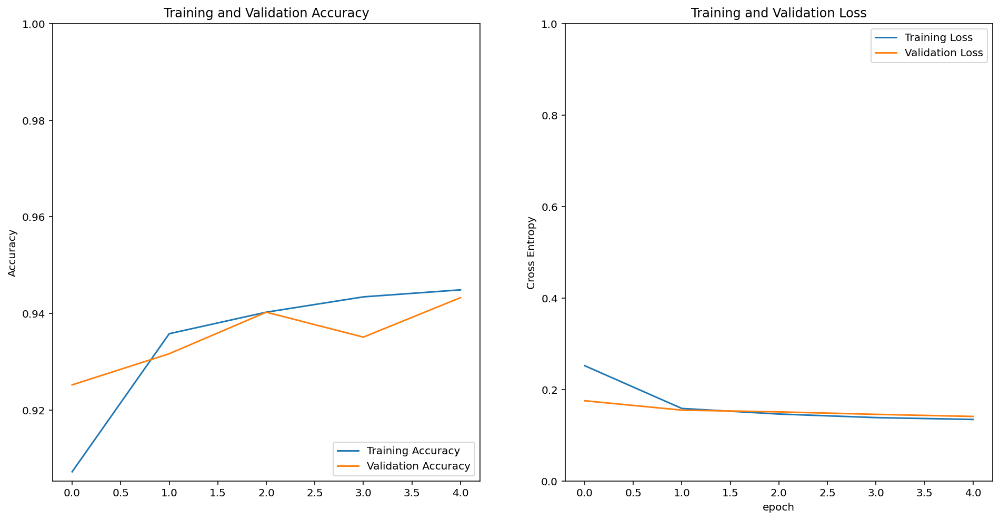

In [39]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, 1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

우리가 직접 만들었던 모델과는 다르게 시작부터 75%를 넘는 정확도에서 꾸준히 올라갈뿐더러 `validation loss`도 매우 안정적으로 학습된다.  

위에서 했던 것과 같이 또 32개의 test sample에 대한 예측 결과를 눈으로도 확인해보자.  
샘플을 `test_batches`에서 가져와서 예측 결과를 만들어보자.

In [40]:
for image_batch, label_batch in test_batches.take(1):
  images = image_batch
  labels = label_batch
  predictions = model.predict(image_batch)
  pass

predictions

array([[9.9998820e-01, 1.1845862e-05],
       [1.1463484e-01, 8.8536513e-01],
       [3.2982793e-01, 6.7017204e-01],
       [9.9999261e-01, 7.4352511e-06],
       [9.9740219e-01, 2.5977802e-03],
       [9.7903204e-01, 2.0967908e-02],
       [1.0951704e-04, 9.9989045e-01],
       [6.4676648e-01, 3.5323355e-01],
       [9.5520657e-01, 4.4793461e-02],
       [9.5159948e-01, 4.8400581e-02],
       [5.2646596e-05, 9.9994731e-01],
       [9.9992359e-01, 7.6371252e-05],
       [9.8707283e-01, 1.2927108e-02],
       [2.9909020e-06, 9.9999702e-01],
       [9.9799609e-01, 2.0038977e-03],
       [9.8355997e-01, 1.6440017e-02],
       [9.9511105e-01, 4.8889681e-03],
       [2.5100108e-02, 9.7489989e-01],
       [5.5137956e-01, 4.4862044e-01],
       [9.9222374e-01, 7.7762827e-03],
       [8.7233281e-01, 1.2766720e-01],
       [9.7850591e-01, 2.1494083e-02],
       [9.9273020e-01, 7.2697527e-03],
       [9.7121328e-01, 2.8786726e-02],
       [9.9755520e-01, 2.4448540e-03],
       [9.8186827e-01, 1.

0과 1사이의 값으로 확률값을 출력했다.  
이번에도 prediction 값들을 실제 추론한 라벨(고양이 : 0, 강아지 : 1)로 변환해보자.

In [41]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

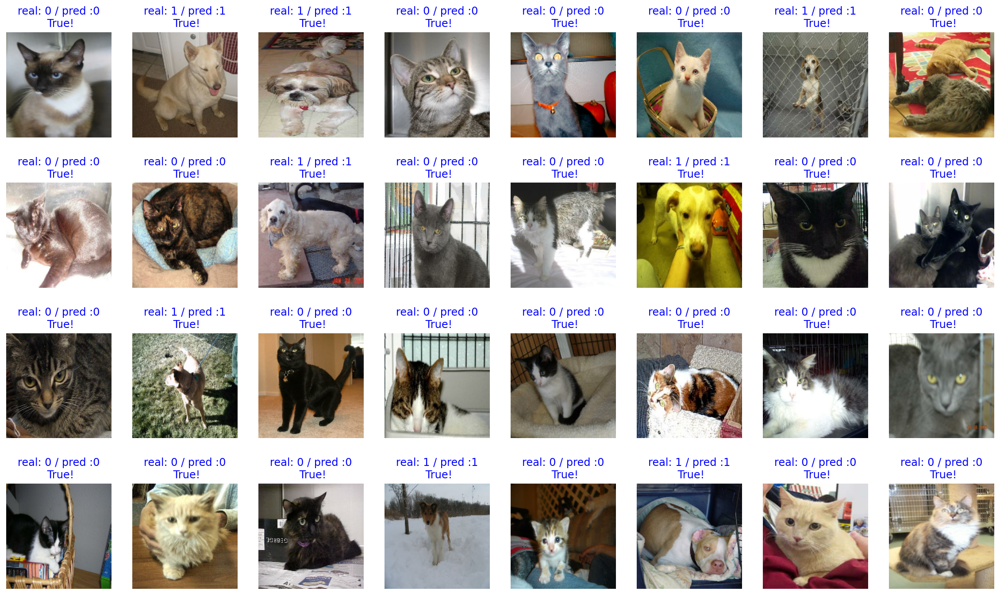

In [42]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
  plt.subplot(4, 8, idx+1)
  image = (image + 1) / 2
  plt.imshow(image)
  correct = label == prediction
  title = f'real: {label} / pred :{prediction}\n {correct}!'
  if not correct:
    plt.title(title, fontdict={'color': 'red'})
  else:
    plt.title(title, fontdict={'color': 'blue'})
  plt.axis('off')

확실히 아까보다 잘 맞추고 있다! 이번에는 32개에 대한 정확도를 확인해보자.

In [43]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0
